In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

#import lsst.ip.diffim as ipDiffim
# I linked from ip_diffim/python/lsst/ip/diffim/imageMapReduce.py into diffimTests/imageMapReduce.py
#    (or copy it)

In [2]:
import diffimTests as dit
#reload(dit)

n_sources = 100

testObj = dit.DiffimTest(varFlux2=np.repeat(620*np.sqrt(2)*2., 10),  #5000, 10), #
                         n_sources=n_sources, verbose=True, sourceFluxRange=(2000., 120000.), 
                         #psf_yvary_factor=0., psfSize=13)
                         psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2, zogyImageSpace=False)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.489249271841 0.495747073509
Variable source: 2 280.657307282 479.785473943 0 1753.62481734
Variable source: 9 52.9427996524 333.913075119 0 1753.62481734
Variable source: 6 439.217764727 150.040535738 0 1753.62481734
Variable source: 4 392.059996116 382.755743646 0 1753.62481734
Variable source: 10 93.0712417961 175.269141681 0 1753.62481734
Variable source: 7 95.4072173246 252.014464774 0 1753.62481734
Variable source: 14 195.790569001 387.96840021 0 1753.62481734
Variable source: 13 142.786620454 169.141320636 0 1753.62481734
Variable source: 3 137.836262016 229.106296765 0 1753.62481734
Variable source: 12 251.386672006 355.010782237 0 1753.62481734
{'Zogy': {'FP': 8, 'FN': 1, 'TP': 9}, 'ALstack': {'FP': 2, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 8, 'FN': 0, 'TP': 10}, 'ALstack_decorr': {'FP': 1, 'FN': 2, 'TP': 8}}


A&L(dec): stats(mean=-0.087669708, stdev=24.157146, min=-115.62471, max=220.30701)
Zogy: stats(mean=-0.10229219229095025, stdev=24.294685659482912, min=-315.48985685438447, max=381.57926010608543)
A&L(dec) - Zogy: stats(mean=-0.005270430037194896, stdev=2.3675467502800696, min=-170.08353657095518, max=222.31343555993664)
A&L(dec) - A&L: stats(mean=-0.016033925, stdev=6.6915474, min=-34.912918, max=56.706299)
Scorr: stats(mean=-5.2806592912718645e-06, stdev=0.00025431963536635846, min=-0.0064014210572427808, max=0.0043334017215311193)
Scorr_var: stats(mean=0.00025421644231013734, stdev=1.1492790171284942e-06, min=0.00024853583170642333, max=0.00086801735899923757)


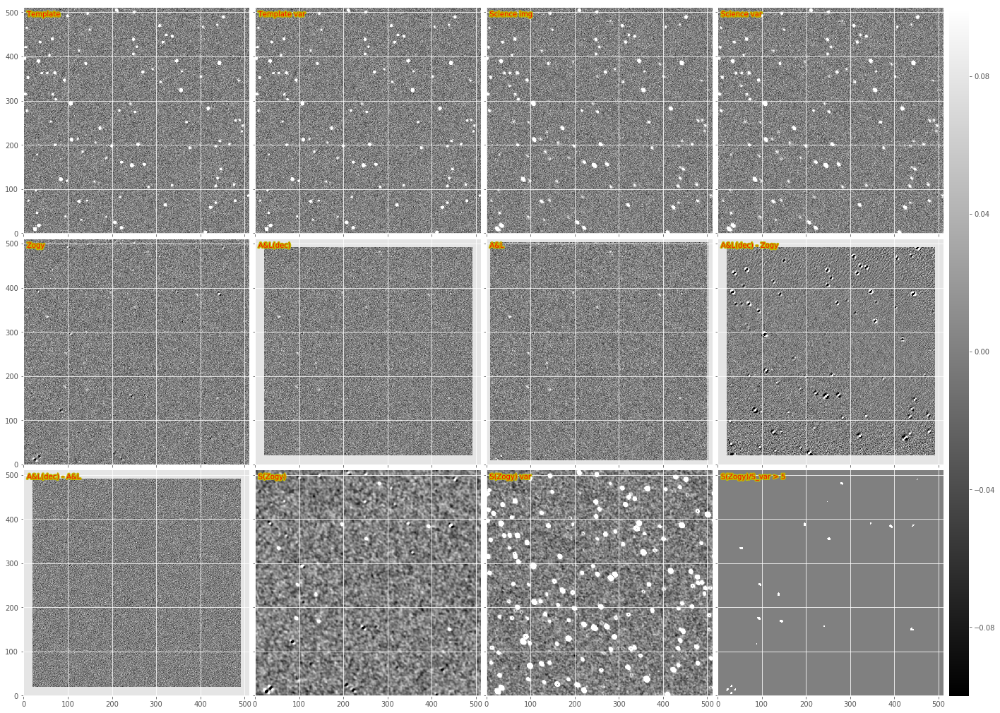

In [3]:
exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

testObj.doPlot(imScale=6, include_Szogy=True);

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.489249271841 0.495747073509
Variable source: 2 280.657307282 479.785473943 0 1753.62481734
Variable source: 9 52.9427996524 333.913075119 0 1753.62481734
Variable source: 6 439.217764727 150.040535738 0 1753.62481734
Variable source: 4 392.059996116 382.755743646 0 1753.62481734
Variable source: 10 93.0712417961 175.269141681 0 1753.62481734
Variable source: 7 95.4072173246 252.014464774 0 1753.62481734
Variable source: 14 195.790569001 387.96840021 0 1753.62481734
Variable source: 13 142.786620454 169.141320636 0 1753.62481734
Variable source: 3 137.836262016 229.106296765 0 1753.62481734
Variable source: 12 251.386672006 355.010782237 0 1753.62481734
{'Zogy': {'FP': 6, 'FN': 1, 'TP': 9}, 'ALstack': {'FP': 2, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 4, 'FN': 1, 'TP': 9}, 'ALstack_decorr': {'FP': 1, 'FN': 2, 'TP': 8}}
A&L(dec): stats(mean=-0.087669708, stdev=24.157146, mi

diffimTests/diffimTests.py:106: RuntimeWarning: invalid value encountered in greater
  imagesToPlot.append((self.S_Zogy.im / self.S_Zogy.var > 5.) * 10.0)


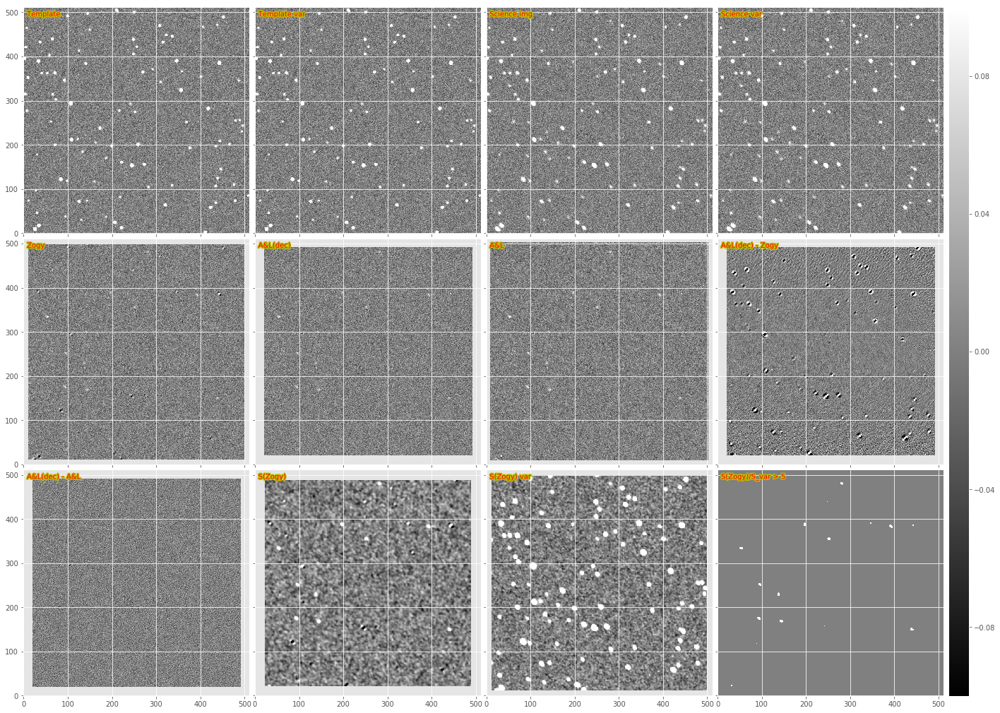

In [4]:
testObj2 = dit.DiffimTest(varFlux2=np.repeat(620*np.sqrt(2)*2., 10),
                         n_sources=n_sources, verbose=True, sourceFluxRange=(2000., 120000.), 
                         #psf_yvary_factor=0., psfSize=13)
                         psf_yvary_factor=0.5, psfSize=13)
res2 = testObj2.runTest(spatialKernelOrder=2, zogyImageSpace=True)
print res2
testObj2.doPlot(imScale=6, include_Szogy=True);

In [5]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.pipe.base as pipeBase

class ZogyMapperSubtask(dit.ImageMapperSubtask):
    ConfigClass = dit.ImageMapperSubtaskConfig
    _DefaultName = 'diffimTests_ZogyMapperSubtask'
    
    def __init__(self, *args, **kwargs):
        dit.ImageMapperSubtask.__init__(self, *args, **kwargs)
        
    def run(self, subExp, expandedSubExp, fullBBox, **kwargs):
        bbox = subExp.getBBox()
        center = ((bbox.getBeginX() + bbox.getEndX()) // 2., (bbox.getBeginY() + bbox.getEndY()) // 2.)
        center = afwGeom.Point2D(center[0], center[1])
        
        variablePsf2 = kwargs.get('variablePsf', None)
        sigmas = kwargs.get('sigmas', None)
        imageSpace = kwargs.get('inImageSpace', False)
        doScorr = kwargs.get('Scorr', False)
                
        # Psf and image for science img (index 2)
        subExp2 = subExp
        if variablePsf2 is None:
            psf2 = subExp.getPsf().computeImage(center).getArray()
            #print 'HERE:', center.getX(), center.getY(), subExp.getPsf().computeShape(center).getDeterminantRadius()
        else:
            psf2 = variablePsf2.getImage(center.getX(), center.getY())
        psf2_orig = psf2
        subim2 = expandedSubExp.getMaskedImage()
        subarr2 = subim2.getImage().getArray()
        subvar2 = subim2.getVariance().getArray()
        if sigmas is None:
            sig2 = np.sqrt(dit.computeClippedImageStats(subvar2).mean)
        else:
            sig2 = sigmas[1]  # for testing, can use the input sigma (global value for entire exposure)
        
        # Psf and image for template img (index 1)
        template = kwargs.get('template')
        subExp1 = afwImage.ExposureF(template, expandedSubExp.getBBox())
        psf1 = template.getPsf().computeImage(center).getArray()
        psf1_orig = psf1
        subim1 = subExp1.getMaskedImage()
        subarr1 = subim1.getImage().getArray()
        subvar1 = subim1.getVariance().getArray()
        if sigmas is None:
            sig1 = np.sqrt(dit.computeClippedImageStats(subvar1).mean)
        else:
            sig1 = sigmas[0]
        
        #shape2 = subExp2.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #shape1 = subExp1.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #print shape2, shape1
        
        psf1b = psf1; psf2b = psf2
        if True and psf1.shape[0] == 41:   # it's a measured psf (hack!) Note this *really* helps for measured psfs.
            psf1b = psf1.copy()
            psf1b[psf1b < 0] = 0
            #psf1b[0:10,0:10] = psf1b[31:41,31:41] = 0
            psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
            psf1b /= psf1b.sum()

            psf2b = psf2.copy()
            psf2b[psf2b < 0] = 0
            psf2b[0:10,:] = psf2b[:,0:10] = psf2b[31:41,:] = psf2b[:,31:41] = 0
            psf2b /= psf2b.sum()

        # from diffimTests.diffimTests ...
        if subarr1.shape[0] < psf1.shape[0] or subarr1.shape[1] < psf1.shape[1]:
            return pipeBase.Struct(subExposure=subExp)

        tmpExp = expandedSubExp.clone()
        tmpIM = tmpExp.getMaskedImage()

        if not doScorr:
            D_zogy, var_zogy = dit.zogy.computeZogy(subarr1, subarr2, subvar1, subvar2,
                              psf1b, psf2b, sig1=sig1, sig2=sig2, inImageSpace=imageSpace)

            tmpIM.getImage().getArray()[:, :] = D_zogy
            tmpIM.getVariance().getArray()[:, :] = var_zogy

        else:
            S, S_var, Pd, Fd = dit.zogy.computeZogyScorr(subarr1, subarr2, subvar1, subvar2, 
                              psf1b, psf2b, sig1=sig1, sig2=sig2, xVarAst=0., yVarAst=0., 
                              inImageSpace=imageSpace, padSize=7)

            tmpIM.getImage().getArray()[:, :] = S
            tmpIM.getVariance().getArray()[:, :] = S_var

        # need to eventually compute diffim PSF and set it here.
        out = afwImage.ExposureF(tmpExp, subExp.getBBox())
                
        return pipeBase.Struct(subExposure=out)

class ZogyMapReduceConfig(dit.ImageMapReduceConfig):
    mapperSubtask = pexConfig.ConfigurableField(
        doc='Zogy subtask to run on each sub-image',
        target=ZogyMapperSubtask
    )

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


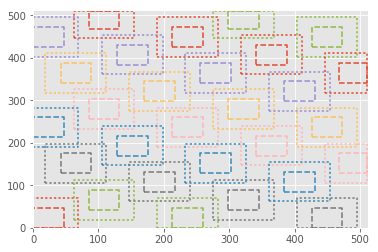

In [6]:
config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
#config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
task._generateGrid(exposure, forceEvenSized=True)
task._plotBoxes(exposure.getBBox(), 5)

In [7]:
newExp = task.run(exposure, template=template, forceEvenSized=True).exposure #, variablePsf=testObj.variablePsf)

In [8]:
# Run with constant variance number to compare with single frame (non-gridded) ZOGY from above:
sig1 = np.sqrt(dit.computeClippedImageStats(template.getMaskedImage().getVariance().getArray()).mean)
sig2 = np.sqrt(dit.computeClippedImageStats(exposure.getMaskedImage().getVariance().getArray()).mean)
print sig1, sig2
newExpA = task.run(exposure, template=template, forceEvenSized=True, sigmas=[sig1, sig2]).exposure

17.3275 17.3313


In [9]:
# Run with ZOGY in image space... ugh. Need bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

newExpB = task.run(exposure, template=template, sigmas=[sig1, sig2], forceEvenSized=True, inImageSpace=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


diffimTests/imageMapReduce.py:268: RuntimeWarning: invalid value encountered in true_divide
  newMI.getImage().getArray()[:, :] /= wts
diffimTests/imageMapReduce.py:269: RuntimeWarning: invalid value encountered in true_divide
  newMI.getVariance().getArray()[:, :] /= wts


In [10]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()
def rb(array, width=5):  # remove border
    shape = array.shape
    return array[width:(shape[0]-width), width:(shape[1]-width)]

stats(mean=0.3722975, stdev=17.345346, min=-75.0, max=3177.0)
stats(mean=-0.11302801, stdev=24.301136, min=-315.49265, max=381.64639)
stats(mean=-0.11386579, stdev=24.301529, min=-315.4884, max=381.57922)
stats(mean=-0.097452573, stdev=24.31057, min=-203.47304, max=381.58127)
stats(mean=0.24200438, stdev=8.497962, min=-39.882561, max=3110.2637)
stats(mean=5.8719760030058695e-07, stdev=0.0045534366845295625, min=-130.67002332487914, max=87.401265737620292)
stats(mean=-2.7524613730118981e-09, stdev=3.9239295597425574e-05, min=-130.72487867155883, max=87.404435751048027)
stats(mean=-2.1985377513622824e-06, stdev=0.0023483555377665812, min=-0.039295722111271303, max=0.042947422505745791)


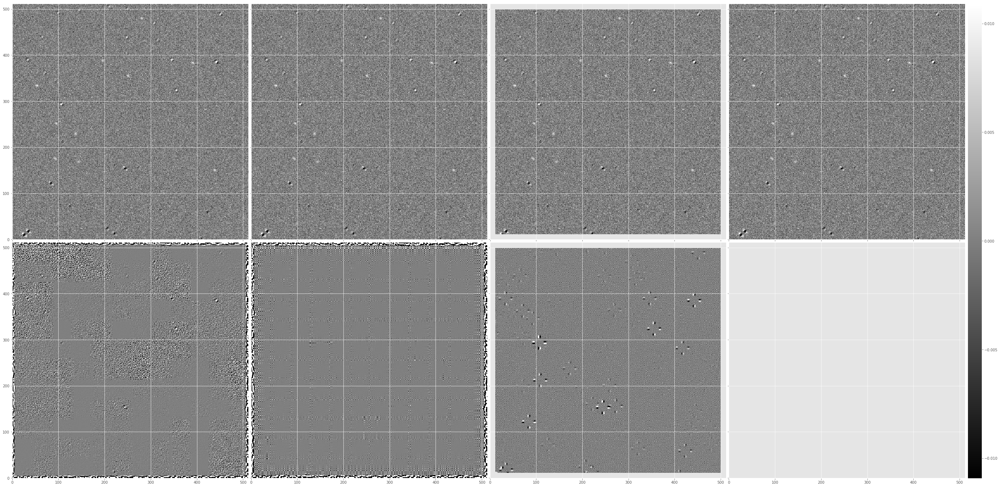

In [11]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(newExpA))
print dit.computeClippedImageStats(ga(newExpB))
print dit.computeClippedImageStats(ga(exposure)-ga(newExp))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpA) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpB) - testObj.D_Zogy.im)
dit.plotImageGrid((ga(newExp), ga(newExpA), ga(newExpB), testObj.D_Zogy.im, ga(newExp)-testObj.D_Zogy.im,
                  ga(newExpA)-testObj.D_Zogy.im, ga(newExpB)-testObj.D_Zogy.im), imScale=12)

try with *input* variable Psf

Now for S_corr

In [12]:
# Need even bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

newExp       = task.run(exposure, template=template, inImageSpace=False, variablePsf=testObj.variablePsf,
                       Scorr=False, forceEvenSized=True).exposure
newExp_Scorr = task.run(exposure, template=template, inImageSpace=False, variablePsf=testObj.variablePsf,
                       Scorr=True, forceEvenSized=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


stats(mean=-4.2421671e-06, stdev=0.00025198911, min=-0.0013512018, max=0.0034238177)
stats(mean=0.0002551901, stdev=1.3078386e-05, min=0.00023032735, max=0.00077975931)
stats(mean=-5.2806592912718645e-06, stdev=0.00025431963536635846, min=-0.0064014210572427808, max=0.0043334017215311193)
stats(mean=0.00025421644231013734, stdev=1.1492790171284942e-06, min=0.00024853583170642333, max=0.00086801735899923757)
stats(mean=2.2876903612251785e-09, stdev=2.4315459915984549e-05, min=-0.0036529616742409432, max=0.0058195957305802702)


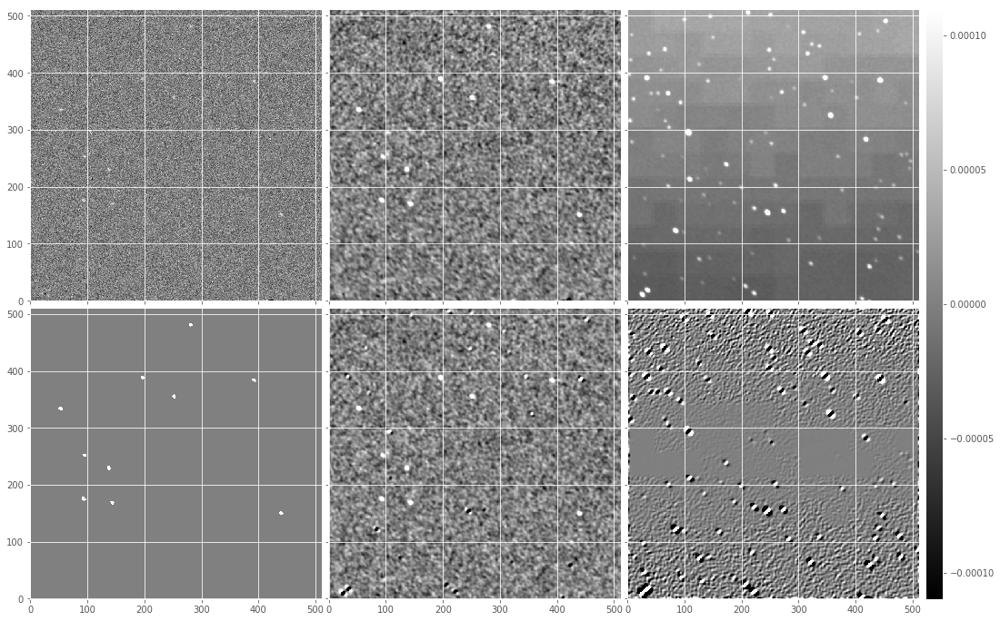

In [13]:
Sim = ga(newExp_Scorr)
Svar = gv(newExp_Scorr)
print dit.computeClippedImageStats(rb(Sim))
print dit.computeClippedImageStats(rb(Svar))
print dit.computeClippedImageStats(testObj.S_Zogy.im)
print dit.computeClippedImageStats(testObj.S_Zogy.var)
print dit.computeClippedImageStats(rb(Sim-testObj.S_Zogy.im))
dit.plotImageGrid((ga(newExp), Sim, Svar, (Sim/Svar > 5.0) * 1.0, testObj.S_Zogy.im, Sim-testObj.S_Zogy.im), imScale=6)

A&L(dec): stats(mean=-0.087669708, stdev=24.157146, min=-115.62471, max=220.30701)
Zogy: stats(mean=-0.098552607, stdev=24.227785, min=-257.74832, max=177.74377)
A&L(dec) - Zogy: stats(mean=-0.0026805631, stdev=2.4133029, min=-36.560196, max=61.107498)
A&L(dec) - A&L: stats(mean=-0.016033925, stdev=6.6915474, min=-34.912918, max=56.706299)
Scorr: stats(mean=-4.7202848e-06, stdev=0.00025230116, min=-0.0029725304, max=0.0034238177)
Scorr_var: stats(mean=0.00025521417, stdev=1.3261302e-05, min=0.00023032735, max=0.00077975931)


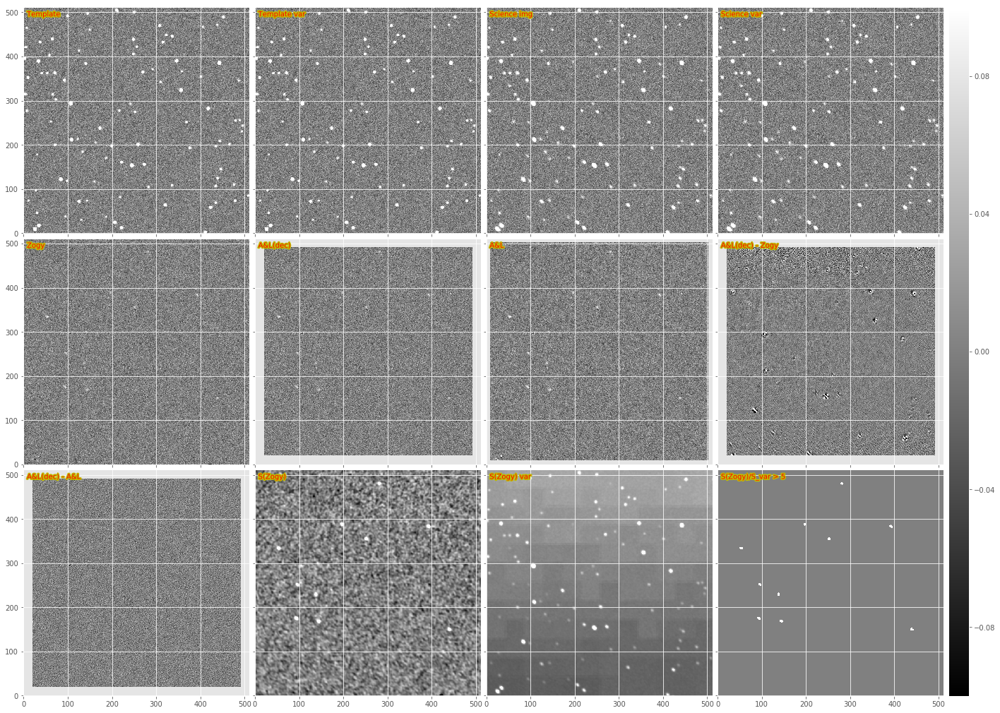

In [14]:
testObj2 = testObj.clone()
testObj2.S_Zogy = dit.Exposure(ga(newExp_Scorr), dit.psf.afwPsfToArray(newExp_Scorr.getPsf()), gv(newExp_Scorr))
testObj2.D_Zogy = dit.Exposure(ga(newExp), dit.psf.afwPsfToArray(newExp.getPsf()), gv(newExp))
testObj2.doPlot(imScale=6, include_Szogy=True);

Time to try measured PSFs again...

In [15]:
import testPsfexPsfEDITED as tpp

exposure2 = testObj.im2.asAfwExposure()
#res = dit.tasks.doMeasurePsf(exposure2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(exposure2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
#res = dit.tasks.doMeasurePsf(template2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(template2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

97
98


(41, 41)
(ixx=4.02223656544, iyy=4.00118515819, ixy=-0.789217640287)


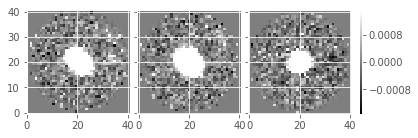

In [23]:
import lsst.afw.geom as afwGeom

# psf1 = psf.computeImage(afwGeom.Point2D(20., 20.)).getArray()
# psf1b = psf1.copy()
# psf1b[psf1b < 0] = 0
# print psf1b[0:10,:].mean(), psf1b[:,0:10].mean(), psf1b[31:41,:].mean(), psf1b[:,31:41].mean()
# psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
# psf1b /= psf1b.sum()

psf = exposure2.getPsf()
print psf.computeImage().getDimensions()
print psf.computeShape()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), 
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

(ixx=2.57593083374, iyy=2.57892138975, ixy=0.0174692068732)


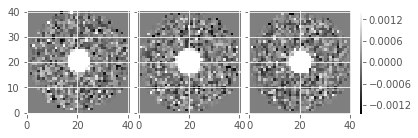

In [24]:
psf = template2.getPsf()
print psf.computeShape()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)),
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


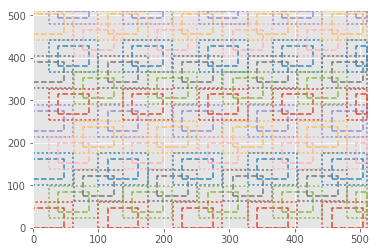

In [18]:
config = ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 10
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

newExp2 = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExp2_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure
task._plotBoxes(exposure2.getBBox())

A&L(dec): stats(mean=-0.087669708, stdev=24.157146, min=-115.62471, max=220.30701)
Zogy: stats(mean=-0.020631578, stdev=23.682789, min=-208.43982, max=365.0)
A&L(dec) - Zogy: stats(mean=-0.0073867519, stdev=27.156454, min=-134.84464, max=239.2133)
A&L(dec) - A&L: stats(mean=-0.016033925, stdev=6.6915474, min=-34.912918, max=56.706299)
Scorr: stats(mean=-4.8494076e-06, stdev=0.00024253887, min=-55.0, max=365.0)
Scorr_var: stats(mean=0.00024497192, stdev=1.2503073e-05, min=0.00021849497, max=665.0)


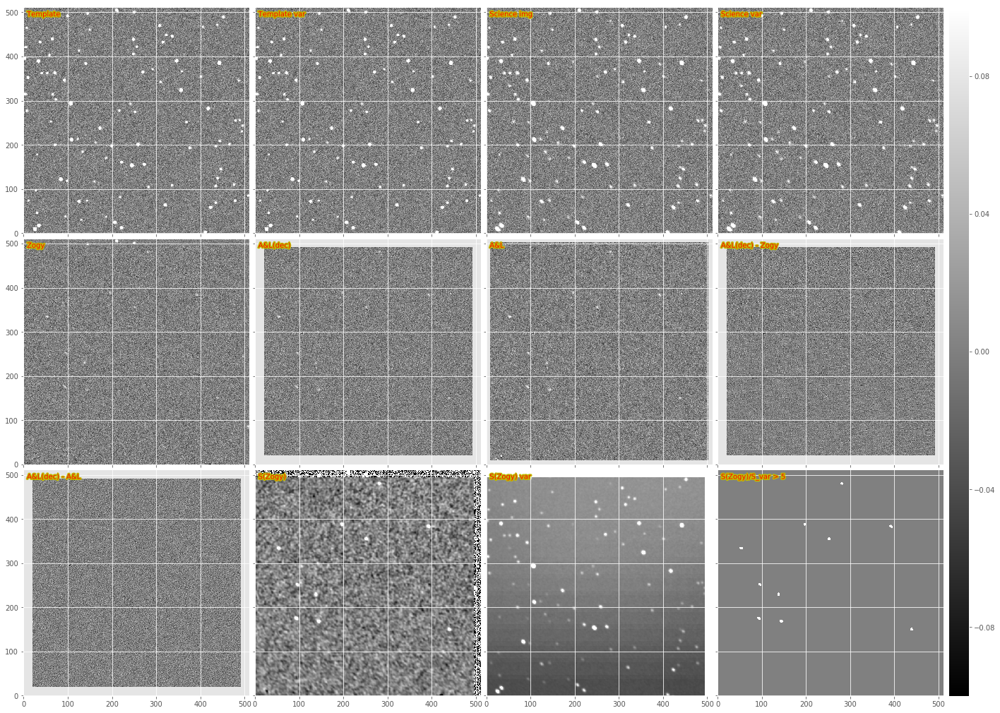

In [19]:
#print dit.computeClippedImageStats(ga(exposure2))
#print dit.computeClippedImageStats(ga(newExp))
#print dit.computeClippedImageStats(ga(newExp2))
#print dit.computeClippedImageStats(ga(exposure2)-ga(newExp2))
#print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
#print dit.computeClippedImageStats(ga(newExp2) - testObj.D_Zogy.im)
#print dit.computeClippedImageStats(ga(newExp) - ga(newExp2))
#dit.plotImageGrid((ga(newExp2), ga(newExp), testObj.S_Zogy.im,
#                  ga(newExp2) - testObj.S_Zogy.im), imScale=12)
testObj2 = testObj.clone()
testObj2.D_Zogy = dit.Exposure(ga(newExp2), dit.psf.afwPsfToArray(newExp2.getPsf()), gv(newExp2))
testObj2.S_Zogy = dit.Exposure(ga(newExp2_Scorr), dit.psf.afwPsfToArray(newExp2_Scorr.getPsf()), gv(newExp2_Scorr))
testObj2.doPlot(imScale=6, include_Szogy=True);

In [20]:
testObj2.runTest()

{'ALstack': {'FN': 0, 'FP': 2, 'TP': 10},
 'ALstack_decorr': {'FN': 2, 'FP': 1, 'TP': 8},
 'SZogy': {'FN': 0, 'FP': 0, 'TP': 10},
 'Zogy': {'FN': 1, 'FP': 1, 'TP': 9}}

In [21]:
# for comparison, without using a spatially-varying PSF:
testObj.runTest()

{'ALstack': {'FN': 0, 'FP': 2, 'TP': 10},
 'ALstack_decorr': {'FN': 2, 'FP': 1, 'TP': 8},
 'SZogy': {'FN': 0, 'FP': 8, 'TP': 10},
 'Zogy': {'FN': 1, 'FP': 8, 'TP': 9}}

In [22]:
# let's add the one where I used the *input* but variable PSF
testObj3 = testObj.clone()
testObj3.D_Zogy = dit.Exposure(ga(newExp), testObj.D_Zogy.psf, newExp.getMaskedImage().getVariance().getArray())
testObj3.S_Zogy = dit.Exposure(ga(newExp_Scorr), dit.psf.afwPsfToArray(newExp_Scorr.getPsf()), gv(newExp_Scorr))
testObj3.runTest()

{'ALstack': {'FN': 0, 'FP': 2, 'TP': 10},
 'ALstack_decorr': {'FN': 2, 'FP': 1, 'TP': 8},
 'SZogy': {'FN': 0, 'FP': 0, 'TP': 10},
 'Zogy': {'FN': 1, 'FP': 1, 'TP': 9}}